<a href="https://colab.research.google.com/github/YulllJ/Day01/blob/main/Banana_Generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Banana Generator
### Original: Celebrity Face Generation with GANs

In [ ]:
!pip install matplotlib
!pip install mpl_toolkits,pandas

!pip install d2l==1.0.3


ERROR: Invalid requirement: 'mpl_toolkits,pandas'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 56.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 95.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 77.0 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4
  Attempting uninstall: pyparsing
    Found existing installation: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:

from d2l import torch as d2l
batch_size = 32
train_iter, _ = d2l.load_data_bananas(batch_size)


read 1000 training examples
read 100 validation examples


In [ ]:
# imports
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
!wget http://d2l-data.s3-accelerate.amazonaws.com/banana-detection.zip

import os

DATA_DIR = '/data/banana-detection/bananas_train/images'

--2023-12-14 07:17:34--  http://d2l-data.s3-accelerate.amazonaws.com/banana-detection.zip
Resolving d2l-data.s3-accelerate.amazonaws.com (d2l-data.s3-accelerate.amazonaws.com)... 13.35.20.172
Connecting to d2l-data.s3-accelerate.amazonaws.com (d2l-data.s3-accelerate.amazonaws.com)|13.35.20.172|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 139442012 (133M) [application/zip]
Saving to: ‘banana-detection.zip’

banana-detection.zi 100%[===================>] 132.98M  31.4MB/s    in 5.2s    

2023-12-14 07:17:39 (25.6 MB/s) - ‘banana-detection.zip’ saved [139442012/139442012]



Let's load this dataset using the ImageFolder class from torchvision. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range (-1, 1), which is more convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) # mean, std for normalize imagess

In [ ]:
import pandas as pd
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset
import random
import numpy as np
import imgaug.augmenters as iaa
class CustomDatasetB(Dataset):
    def __init__(self, root, annotations_file, transform=None):
        self.root = root
        self.transform = transform
        self.annotations = pd.read_csv(annotations_file)
        self.images = [img for img in os.listdir(root) if img.endswith('.png') and 0 <= int(img.split('.')[0]) < 1000]
        self.noise_augmenter = iaa.Sequential([
                    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 255), per_channel=1.0)
                ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_row = self.annotations.loc[self.annotations['img_name'] == img_name]

        if img_row.empty:
            return None, None

        xmin, ymin, xmax, ymax = img_row[['xmin', 'ymin', 'xmax', 'ymax']].values[0]
        img_path = os.path.join(self.root, img_name)
        original_image = Image.open(img_path)
        np_image = np.array(original_image)

        # 노이즈 적용
        noisy_image = self.noise_augmenter.augment_image(np_image)

        # 바나나 부분을 원본 이미지로 복원
        noisy_image[ymin:ymax, xmin:xmax] = np_image[ymin:ymax, xmin:xmax]

        final_image = Image.fromarray(noisy_image)

        if self.transform:
            final_image = self.transform(final_image)

        label = img_row['label'].values[0]

        # 변환된 이미지 저장
        new_img_name = f"{1000 + idx}.png"
        output_image_path = os.path.join(self.root, new_img_name)
        final_image_pil = transforms.ToPILImage()(final_image)
        final_image_pil.save(output_image_path)

        return final_image, label

# Define transformations
transform = transforms.Compose([
    #transforms.Resize((64, 64)),
    transforms.ToTensor(),
   # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Instantiate the dataset
annotations_file = '/data/banana-detection/bananas_train/label.csv'
root_dir = "/data/banana-detection/bananas_train/images/"

dataset = CustomDatasetB(root=root_dir, annotations_file=annotations_file, transform=transform)

# Example usage
for img, label in dataset:
    if img is not None and label is not None:
        # Do something with img and label
        pass


In [ ]:
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
####기존 data 전처리
# 이미지의 전처리 과정
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),  # CenterCrop 주석 처리
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

class CustomDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.images = os.listdir(root)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root, self.images[idx])
        image = Image.open(img_name)
        if self.transform:
            image = self.transform(image)
        return image, 0  # 여기서 0은 더미(label) 값으로, 실제 데이터셋에 맞게 수정해야 합니다.

# 데이터 로더 설정
batch_size = 64
train_dataset = CustomDataset(root="/data/banana-detection/bananas_train/images/", transform=transform)
train_dl = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)

# 데이터 로더 사용 예시
for images, labels in train_dl:
    # images와 labels을 사용하여 모델을 훈련하거나 다른 작업을 수행
    pass




Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.



In [ ]:
def denorm(img_tensors):
    "Denormalize image tensor with specified mean and std"
    return img_tensors * stats[1][0] + stats[0][0]

Note that In Pytorch -> C x Hx W whereas Matplotlib reques H x W x C. So, permute(1, 2, 0) do this.

In [ ]:
def show_images(images, nmax=64):
  fig, ax = plt.subplots(figsize=(8,8))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
  for images, _ in dl:
    show_images(images, nmax)
    break

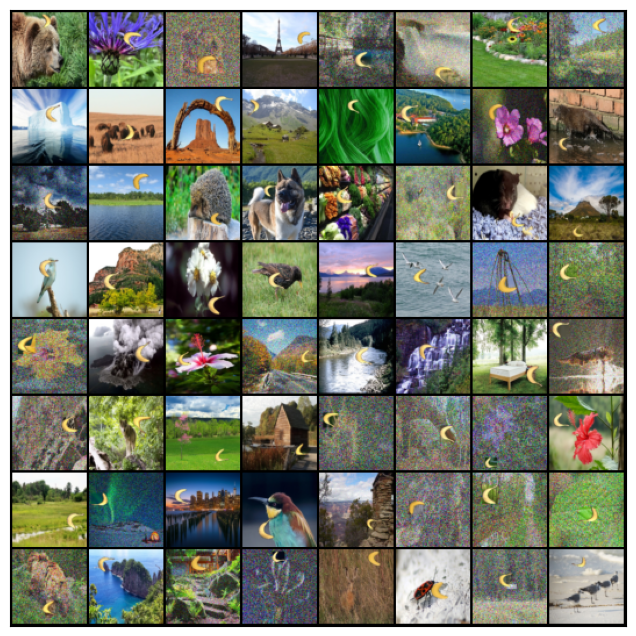

In [ ]:
show_batch(train_dl)

## Using a GPU

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    """ 3 things:
    1. Connected to Nvidia GPU
    2. Cuda drivers
    3. Pytorch suitable to GPU version
    then torch.cuda.is_available is True
    """
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
  """Move tensor(s) to chosen device"""
  if isinstance(data, (list,tuple)):
      return [to_device(x, device) for x in data]
  return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

# Build GAN

# Discriminator Network

In [ ]:
discriminator = nn.Sequential(
    # in: 3x 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

In [ ]:
discriminator = to_device(discriminator, device)

#### Lets print output shape after each layer of discrminator.

In [ ]:
# create a tensor Batch_Size,C,H,W
X = torch.rand(size=(1, 3, 64, 64), dtype=torch.float32, device=device)
for layer in discriminator:
    X = layer(X)
    print(layer.__class__.__name__,'output shape: \t',X.shape)

Conv2d output shape: 	 torch.Size([1, 64, 32, 32])
BatchNorm2d output shape: 	 torch.Size([1, 64, 32, 32])
LeakyReLU output shape: 	 torch.Size([1, 64, 32, 32])
Conv2d output shape: 	 torch.Size([1, 128, 16, 16])
BatchNorm2d output shape: 	 torch.Size([1, 128, 16, 16])
LeakyReLU output shape: 	 torch.Size([1, 128, 16, 16])
Conv2d output shape: 	 torch.Size([1, 256, 8, 8])
BatchNorm2d output shape: 	 torch.Size([1, 256, 8, 8])
LeakyReLU output shape: 	 torch.Size([1, 256, 8, 8])
Conv2d output shape: 	 torch.Size([1, 512, 4, 4])
BatchNorm2d output shape: 	 torch.Size([1, 512, 4, 4])
LeakyReLU output shape: 	 torch.Size([1, 512, 4, 4])
Conv2d output shape: 	 torch.Size([1, 1, 1, 1])
Flatten output shape: 	 torch.Size([1, 1])
Sigmoid output shape: 	 torch.Size([1, 1])


# Generator Network

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()  # output is between -1 to 1
    # out: 3 x 64 x 64
)

#### Lets print output shape after each layer of generator.

In [ ]:
X = torch.randn(size=(1, 128, 1, 1))
for layer in generator:
  X = layer(X)
  print(layer.__class__.__name__,'output shape: \t',X.shape)

ConvTranspose2d output shape: 	 torch.Size([1, 512, 4, 4])
BatchNorm2d output shape: 	 torch.Size([1, 512, 4, 4])
ReLU output shape: 	 torch.Size([1, 512, 4, 4])
ConvTranspose2d output shape: 	 torch.Size([1, 256, 8, 8])
BatchNorm2d output shape: 	 torch.Size([1, 256, 8, 8])
ReLU output shape: 	 torch.Size([1, 256, 8, 8])
ConvTranspose2d output shape: 	 torch.Size([1, 128, 16, 16])
BatchNorm2d output shape: 	 torch.Size([1, 128, 16, 16])
ReLU output shape: 	 torch.Size([1, 128, 16, 16])
ConvTranspose2d output shape: 	 torch.Size([1, 64, 32, 32])
BatchNorm2d output shape: 	 torch.Size([1, 64, 32, 32])
ReLU output shape: 	 torch.Size([1, 64, 32, 32])
ConvTranspose2d output shape: 	 torch.Size([1, 3, 64, 64])
Tanh output shape: 	 torch.Size([1, 3, 64, 64])


#### Lets see fake_images generated by generator before training. Just for curiosity.

torch.Size([64, 3, 64, 64])


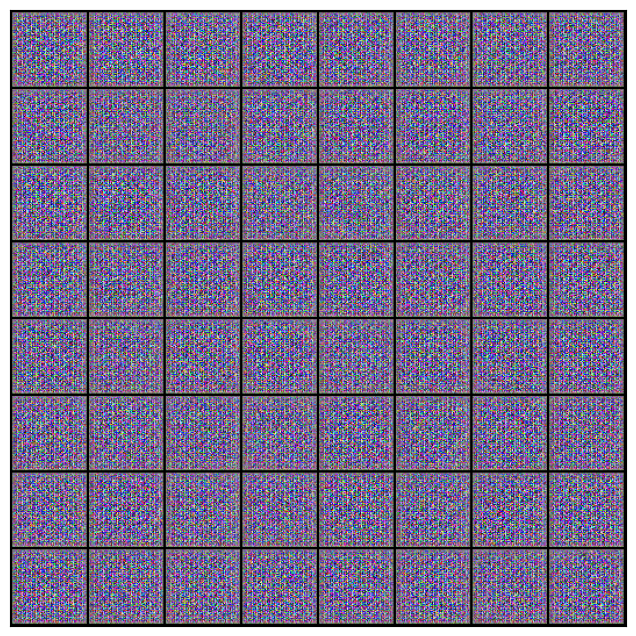

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)


#### Remember in PyTorch, we have to move data, model in GPU for computation. So, `to_device` do that work.

In [ ]:
generator = to_device(generator, device) # move generator to device

## Training Discriminator

In [ ]:
def train_discriminator(real_images, opt_d):
  # Clear discriminator gradients
  opt_d.zero_grad()

  # Pass real images through  discriminator
  real_preds = discriminator(real_images)
  real_targets = torch.ones(real_images.size(0), 1, device=device)
  real_loss = F.binary_cross_entropy(real_preds, real_targets)
  real_score = torch.mean(real_preds).item()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
  fake_images = generator(latent)

  # Pass Fake images through discriminator
  fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
  fake_preds = discriminator(fake_images)
  fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()

  # Update discriminator weights
  loss = real_loss + fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(), real_score, fake_score



Here are the steps involved in training the discriminator.

* We expect the discriminator to output 1 if the image was picked from the real Anime Faces dataset, and 0 if it was generated using the generator network.

* We first pass a batch of real images, and compute the loss, setting the target labels to 1.

* Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

* Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.



It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

## Generator Training

* We generate a batch of images using the generator, pass the into the discriminator.

* We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

* We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

In [ ]:
def train_generator(opt_g):
  # Clear generator gradients
  opt_g.zero_grad()

  # Generate fake images
  latent = torch.randn(batch_size, latent_size, 1,1, device=device)
  fake_images = generator(latent)

  # Try to fool the discriminator
  preds = discriminator(fake_images)
  targets = torch.ones(batch_size, 1, device=device)
  loss = F.binary_cross_entropy(preds, targets)

  # Update generator
  loss.backward()
  opt_g.step()

  return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [ ]:
from torchvision.utils import save_image


In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

data_dir = 'generated_data'
os.makedirs(data_dir, exist_ok=True)



In [ ]:
def final_save_samples(show=True):
  for j in range(64):
    final_latent = torch.randn(1, latent_size, 1, 1, device=device)
    fake_images = generator(final_latent)
    fake_fname = 'generated_data=images-{0:0=4d}.png'.format(j)
    save_image(denorm(fake_images), os.path.join(data_dir, fake_fname))
    print("Saving", fake_fname)
  '''
  if show:
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
  '''

In [ ]:
def save_samples(index, latent_tensors, show=True):
  fake_images = generator(latent_tensors)
  fake_fname = 'generated=images-{0:0=4d}.png'.format(index)
  save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
  print("Saving", fake_fname)
  if index==500:
    final_save_samples()
  if show:
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)


## Training Loop

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx = 1):
  torch.cuda.empty_cache()

  # Losses & scores
  losses_g = []
  losses_d = []
  real_scores = []
  fake_scores = []

  # Create optimizers
  opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
  opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

  for epoch in range(epochs):
    for real_images, _ in tqdm(train_dl):
      # Train discriminator
      loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
      # Train generator
      loss_g = train_generator(opt_g)

    # Record losses & scores
    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_scores.append(real_score)
    fake_scores.append(fake_score)

    # Log losses & scores (last batch)
    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    # Save generated images
    save_samples(epoch+start_idx, fixed_latent, show=False)

  return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.



In [ ]:
# Hyperparameters
lr = 0.00025
epochs = 500

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 6.5551, loss_d: 1.2591, real_score: 0.8871, fake_score: 0.6634
Saving generated=images-0001.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 4.3684, loss_d: 0.4759, real_score: 0.6755, fake_score: 0.0334
Saving generated=images-0002.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 5.3518, loss_d: 0.6884, real_score: 0.8397, fake_score: 0.3117
Saving generated=images-0003.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 1.5009, loss_d: 3.3150, real_score: 0.1471, fake_score: 0.0047
Saving generated=images-0004.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 1.7756, loss_d: 1.1279, real_score: 0.5705, fake_score: 0.3660
Saving generated=images-0005.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 2.1410, loss_d: 0.6605, real_score: 0.7198, fake_score: 0.2304
Saving generated=images-0006.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 3.0796, loss_d: 0.7885, real_score: 0.8102, fake_score: 0.3884
Saving generated=images-0007.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 1.4583, loss_d: 0.4661, real_score: 0.8258, fake_score: 0.2177
Saving generated=images-0008.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 1.7746, loss_d: 1.2236, real_score: 0.3782, fake_score: 0.1072
Saving generated=images-0009.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 2.4392, loss_d: 0.9397, real_score: 0.7699, fake_score: 0.4542
Saving generated=images-0010.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 2.4930, loss_d: 0.9552, real_score: 0.6152, fake_score: 0.3355
Saving generated=images-0011.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 1.6124, loss_d: 1.0527, real_score: 0.5593, fake_score: 0.3166
Saving generated=images-0012.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 2.9162, loss_d: 0.9484, real_score: 0.6685, fake_score: 0.3484
Saving generated=images-0013.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 1.6620, loss_d: 0.8503, real_score: 0.5616, fake_score: 0.1878
Saving generated=images-0014.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 1.8365, loss_d: 0.6593, real_score: 0.6128, fake_score: 0.1018
Saving generated=images-0015.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 3.4964, loss_d: 0.5722, real_score: 0.8217, fake_score: 0.2944
Saving generated=images-0016.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 2.5410, loss_d: 0.6116, real_score: 0.6183, fake_score: 0.0682
Saving generated=images-0017.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 2.6946, loss_d: 0.4540, real_score: 0.7689, fake_score: 0.1577
Saving generated=images-0018.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 2.7692, loss_d: 0.5896, real_score: 0.6600, fake_score: 0.1089
Saving generated=images-0019.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 2.5975, loss_d: 0.5951, real_score: 0.7042, fake_score: 0.1784
Saving generated=images-0020.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 3.9785, loss_d: 0.8817, real_score: 0.7389, fake_score: 0.4093
Saving generated=images-0021.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 3.8008, loss_d: 0.7987, real_score: 0.7590, fake_score: 0.3694
Saving generated=images-0022.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 2.3164, loss_d: 0.7924, real_score: 0.8282, fake_score: 0.3984
Saving generated=images-0023.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 3.0011, loss_d: 1.1732, real_score: 0.6298, fake_score: 0.4159
Saving generated=images-0024.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 3.4752, loss_d: 0.6578, real_score: 0.7381, fake_score: 0.2707
Saving generated=images-0025.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 3.9400, loss_d: 0.9210, real_score: 0.7367, fake_score: 0.3847
Saving generated=images-0026.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 3.5699, loss_d: 0.8064, real_score: 0.6919, fake_score: 0.3120
Saving generated=images-0027.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 2.4685, loss_d: 1.3471, real_score: 0.3409, fake_score: 0.0233
Saving generated=images-0028.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 4.9720, loss_d: 0.8026, real_score: 0.8831, fake_score: 0.4468
Saving generated=images-0029.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 2.8651, loss_d: 0.6109, real_score: 0.6597, fake_score: 0.1582
Saving generated=images-0030.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 4.7331, loss_d: 0.9254, real_score: 0.8526, fake_score: 0.4776
Saving generated=images-0031.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 2.7341, loss_d: 0.4730, real_score: 0.7673, fake_score: 0.1537
Saving generated=images-0032.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 2.7513, loss_d: 0.5628, real_score: 0.7402, fake_score: 0.2105
Saving generated=images-0033.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 2.0329, loss_d: 0.7670, real_score: 0.6704, fake_score: 0.2438
Saving generated=images-0034.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 3.6596, loss_d: 0.4042, real_score: 0.8110, fake_score: 0.1530
Saving generated=images-0035.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 2.2283, loss_d: 0.9416, real_score: 0.5224, fake_score: 0.1574
Saving generated=images-0036.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 4.7864, loss_d: 0.4271, real_score: 0.8673, fake_score: 0.2163
Saving generated=images-0037.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 4.4067, loss_d: 0.7124, real_score: 0.8259, fake_score: 0.3598
Saving generated=images-0038.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 4.4291, loss_d: 0.6243, real_score: 0.8442, fake_score: 0.3273
Saving generated=images-0039.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 1.8994, loss_d: 0.5442, real_score: 0.6973, fake_score: 0.1345
Saving generated=images-0040.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 3.4388, loss_d: 0.4775, real_score: 0.8466, fake_score: 0.2357
Saving generated=images-0041.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 4.3455, loss_d: 0.5212, real_score: 0.8237, fake_score: 0.2464
Saving generated=images-0042.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 4.3883, loss_d: 0.7816, real_score: 0.8601, fake_score: 0.3994
Saving generated=images-0043.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 3.5587, loss_d: 0.4486, real_score: 0.7152, fake_score: 0.0745
Saving generated=images-0044.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 5.8659, loss_d: 0.5215, real_score: 0.9334, fake_score: 0.3270
Saving generated=images-0045.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 2.8111, loss_d: 0.4107, real_score: 0.7731, fake_score: 0.1164
Saving generated=images-0046.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 4.6700, loss_d: 0.3110, real_score: 0.8563, fake_score: 0.1239
Saving generated=images-0047.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 3.1699, loss_d: 0.5578, real_score: 0.7374, fake_score: 0.1732
Saving generated=images-0048.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 5.4698, loss_d: 0.4262, real_score: 0.8645, fake_score: 0.2243
Saving generated=images-0049.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 5.7959, loss_d: 0.6555, real_score: 0.8710, fake_score: 0.3182
Saving generated=images-0050.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 4.7933, loss_d: 0.1712, real_score: 0.9131, fake_score: 0.0720
Saving generated=images-0051.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 4.6244, loss_d: 0.4860, real_score: 0.8108, fake_score: 0.2015
Saving generated=images-0052.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 4.0121, loss_d: 0.4733, real_score: 0.7846, fake_score: 0.1666
Saving generated=images-0053.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 3.8977, loss_d: 0.4418, real_score: 0.6895, fake_score: 0.0483
Saving generated=images-0054.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 4.5260, loss_d: 0.4402, real_score: 0.8257, fake_score: 0.1917
Saving generated=images-0055.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 1.9778, loss_d: 0.8106, real_score: 0.5998, fake_score: 0.1487
Saving generated=images-0056.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 4.7209, loss_d: 0.6746, real_score: 0.5884, fake_score: 0.0144
Saving generated=images-0057.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 3.9034, loss_d: 0.2529, real_score: 0.9095, fake_score: 0.1084
Saving generated=images-0058.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 5.2477, loss_d: 0.3046, real_score: 0.7668, fake_score: 0.0084
Saving generated=images-0059.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 3.3909, loss_d: 0.2633, real_score: 0.8753, fake_score: 0.1066
Saving generated=images-0060.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 5.6113, loss_d: 0.4102, real_score: 0.9253, fake_score: 0.2480
Saving generated=images-0061.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 4.4407, loss_d: 0.2659, real_score: 0.9052, fake_score: 0.1383
Saving generated=images-0062.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 6.2554, loss_d: 0.4772, real_score: 0.9904, fake_score: 0.2693
Saving generated=images-0063.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 4.3397, loss_d: 0.5039, real_score: 0.6794, fake_score: 0.0396
Saving generated=images-0064.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 6.7896, loss_d: 0.4990, real_score: 0.9531, fake_score: 0.3214
Saving generated=images-0065.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 4.4320, loss_d: 0.4550, real_score: 0.6822, fake_score: 0.0079
Saving generated=images-0066.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 4.1450, loss_d: 0.3019, real_score: 0.7867, fake_score: 0.0291
Saving generated=images-0067.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 4.7131, loss_d: 0.2271, real_score: 0.9186, fake_score: 0.1004
Saving generated=images-0068.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 4.4344, loss_d: 0.3425, real_score: 0.7440, fake_score: 0.0118
Saving generated=images-0069.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 4.8633, loss_d: 0.2597, real_score: 0.9114, fake_score: 0.1379
Saving generated=images-0070.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 0.7266, loss_d: 0.5816, real_score: 0.6364, fake_score: 0.0652
Saving generated=images-0071.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 3.4850, loss_d: 0.3531, real_score: 0.8442, fake_score: 0.0806
Saving generated=images-0072.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 4.8845, loss_d: 0.1286, real_score: 0.9510, fake_score: 0.0682
Saving generated=images-0073.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 2.7733, loss_d: 0.4477, real_score: 0.7164, fake_score: 0.0362
Saving generated=images-0074.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 2.1159, loss_d: 0.3224, real_score: 0.7867, fake_score: 0.0351
Saving generated=images-0075.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 4.8149, loss_d: 0.2120, real_score: 0.9310, fake_score: 0.1048
Saving generated=images-0076.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 6.2685, loss_d: 0.1906, real_score: 0.9813, fake_score: 0.1433
Saving generated=images-0077.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 4.1018, loss_d: 0.1269, real_score: 0.9290, fake_score: 0.0441
Saving generated=images-0078.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 3.9362, loss_d: 0.1973, real_score: 0.8688, fake_score: 0.0196
Saving generated=images-0079.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 3.0989, loss_d: 0.2825, real_score: 0.8070, fake_score: 0.0456
Saving generated=images-0080.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 4.6559, loss_d: 0.2084, real_score: 0.8668, fake_score: 0.0481
Saving generated=images-0081.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 4.1607, loss_d: 0.2163, real_score: 0.8563, fake_score: 0.0388
Saving generated=images-0082.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 5.4389, loss_d: 0.1517, real_score: 0.9317, fake_score: 0.0606
Saving generated=images-0083.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 4.8145, loss_d: 0.1928, real_score: 0.9211, fake_score: 0.0899
Saving generated=images-0084.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 5.5214, loss_d: 0.1238, real_score: 0.9565, fake_score: 0.0707
Saving generated=images-0085.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 6.4150, loss_d: 0.0862, real_score: 0.9548, fake_score: 0.0368
Saving generated=images-0086.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 3.4816, loss_d: 0.2493, real_score: 0.8113, fake_score: 0.0223
Saving generated=images-0087.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 4.9164, loss_d: 0.2202, real_score: 0.8301, fake_score: 0.0085
Saving generated=images-0088.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 4.6731, loss_d: 0.1250, real_score: 0.9605, fake_score: 0.0725
Saving generated=images-0089.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 6.4927, loss_d: 0.2429, real_score: 0.8168, fake_score: 0.0031
Saving generated=images-0090.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 6.0210, loss_d: 0.1008, real_score: 0.9665, fake_score: 0.0587
Saving generated=images-0091.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 3.3423, loss_d: 0.1642, real_score: 0.9006, fake_score: 0.0456
Saving generated=images-0092.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 4.5898, loss_d: 0.1152, real_score: 0.9397, fake_score: 0.0405
Saving generated=images-0093.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 9.3194, loss_d: 0.5615, real_score: 0.9844, fake_score: 0.3060
Saving generated=images-0094.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 4.3128, loss_d: 0.3205, real_score: 0.8693, fake_score: 0.1259
Saving generated=images-0095.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 5.9447, loss_d: 0.0447, real_score: 0.9802, fake_score: 0.0238
Saving generated=images-0096.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 4.8074, loss_d: 0.1102, real_score: 0.9408, fake_score: 0.0450
Saving generated=images-0097.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 5.5400, loss_d: 0.1387, real_score: 0.9571, fake_score: 0.0822
Saving generated=images-0098.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 4.1605, loss_d: 0.1613, real_score: 0.8844, fake_score: 0.0185
Saving generated=images-0099.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 6.4266, loss_d: 0.0783, real_score: 0.9450, fake_score: 0.0200
Saving generated=images-0100.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 4.9672, loss_d: 0.0620, real_score: 0.9705, fake_score: 0.0289
Saving generated=images-0101.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 7.0416, loss_d: 0.0786, real_score: 0.9695, fake_score: 0.0417
Saving generated=images-0102.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 4.3631, loss_d: 0.1195, real_score: 0.9003, fake_score: 0.0101
Saving generated=images-0103.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 6.4778, loss_d: 0.1029, real_score: 0.9627, fake_score: 0.0577
Saving generated=images-0104.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 5.8911, loss_d: 0.1130, real_score: 0.9432, fake_score: 0.0393
Saving generated=images-0105.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 2.2673, loss_d: 0.3603, real_score: 0.7723, fake_score: 0.0350
Saving generated=images-0106.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 9.6459, loss_d: 0.2319, real_score: 0.8587, fake_score: 0.0143
Saving generated=images-0107.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 4.9998, loss_d: 0.2628, real_score: 0.8866, fake_score: 0.0950
Saving generated=images-0108.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 6.3164, loss_d: 0.2060, real_score: 0.9456, fake_score: 0.1118
Saving generated=images-0109.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 4.5827, loss_d: 0.1411, real_score: 0.9173, fake_score: 0.0464
Saving generated=images-0110.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 6.1361, loss_d: 0.1007, real_score: 0.9666, fake_score: 0.0591
Saving generated=images-0111.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 6.1017, loss_d: 0.2309, real_score: 0.9227, fake_score: 0.1175
Saving generated=images-0112.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 5.3755, loss_d: 0.0150, real_score: 0.9923, fake_score: 0.0071
Saving generated=images-0113.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 3.5888, loss_d: 0.2203, real_score: 0.8432, fake_score: 0.0161
Saving generated=images-0114.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 5.8400, loss_d: 0.0405, real_score: 0.9772, fake_score: 0.0168
Saving generated=images-0115.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 4.7983, loss_d: 0.0844, real_score: 0.9415, fake_score: 0.0209
Saving generated=images-0116.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 5.7729, loss_d: 0.0586, real_score: 0.9677, fake_score: 0.0235
Saving generated=images-0117.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 5.6322, loss_d: 0.0362, real_score: 0.9814, fake_score: 0.0164
Saving generated=images-0118.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 6.3839, loss_d: 0.0350, real_score: 0.9788, fake_score: 0.0125
Saving generated=images-0119.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 12.6635, loss_d: 3.1572, real_score: 0.1480, fake_score: 0.0000
Saving generated=images-0120.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 5.2876, loss_d: 0.2429, real_score: 0.9402, fake_score: 0.1018
Saving generated=images-0121.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 3.8984, loss_d: 0.2747, real_score: 0.8370, fake_score: 0.0588
Saving generated=images-0122.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 4.1090, loss_d: 0.1711, real_score: 0.8658, fake_score: 0.0078
Saving generated=images-0123.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 6.7129, loss_d: 0.0247, real_score: 0.9983, fake_score: 0.0218
Saving generated=images-0124.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 6.4382, loss_d: 0.0339, real_score: 0.9865, fake_score: 0.0198
Saving generated=images-0125.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 3.1337, loss_d: 0.3683, real_score: 0.8163, fake_score: 0.0989
Saving generated=images-0126.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 6.8393, loss_d: 0.0797, real_score: 0.9440, fake_score: 0.0169
Saving generated=images-0127.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 4.8830, loss_d: 0.1013, real_score: 0.9304, fake_score: 0.0230
Saving generated=images-0128.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 5.8649, loss_d: 0.0905, real_score: 0.9807, fake_score: 0.0628
Saving generated=images-0129.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 7.1264, loss_d: 0.0845, real_score: 0.9895, fake_score: 0.0647
Saving generated=images-0130.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 5.4293, loss_d: 0.0502, real_score: 0.9873, fake_score: 0.0334
Saving generated=images-0131.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 6.0184, loss_d: 0.0538, real_score: 0.9825, fake_score: 0.0335
Saving generated=images-0132.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 1.8493, loss_d: 0.2289, real_score: 0.8285, fake_score: 0.0162
Saving generated=images-0133.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 6.9648, loss_d: 0.0804, real_score: 0.9275, fake_score: 0.0014
Saving generated=images-0134.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 5.5705, loss_d: 0.0541, real_score: 0.9740, fake_score: 0.0260
Saving generated=images-0135.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 7.8637, loss_d: 0.0283, real_score: 0.9803, fake_score: 0.0080
Saving generated=images-0136.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 2.5429, loss_d: 0.2721, real_score: 0.8069, fake_score: 0.0031
Saving generated=images-0137.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 7.7617, loss_d: 0.0581, real_score: 0.9857, fake_score: 0.0390
Saving generated=images-0138.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 6.0903, loss_d: 0.0196, real_score: 0.9930, fake_score: 0.0122
Saving generated=images-0139.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 6.4862, loss_d: 0.0850, real_score: 0.9246, fake_score: 0.0015
Saving generated=images-0140.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 2.1511, loss_d: 0.2078, real_score: 0.8317, fake_score: 0.0056
Saving generated=images-0141.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 7.7629, loss_d: 0.2485, real_score: 0.9699, fake_score: 0.1402
Saving generated=images-0142.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 4.8367, loss_d: 0.3815, real_score: 0.7501, fake_score: 0.0075
Saving generated=images-0143.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 1.4822, loss_d: 0.4094, real_score: 0.7034, fake_score: 0.0101
Saving generated=images-0144.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 6.7768, loss_d: 0.1095, real_score: 0.9690, fake_score: 0.0657
Saving generated=images-0145.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 5.6866, loss_d: 0.0308, real_score: 0.9932, fake_score: 0.0231
Saving generated=images-0146.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 4.4431, loss_d: 0.1154, real_score: 0.9105, fake_score: 0.0106
Saving generated=images-0147.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 5.5416, loss_d: 0.0368, real_score: 0.9787, fake_score: 0.0144
Saving generated=images-0148.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 6.6996, loss_d: 0.0298, real_score: 0.9869, fake_score: 0.0159
Saving generated=images-0149.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 5.4725, loss_d: 0.0638, real_score: 0.9552, fake_score: 0.0140
Saving generated=images-0150.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 6.4521, loss_d: 0.0811, real_score: 0.9781, fake_score: 0.0535
Saving generated=images-0151.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 7.6283, loss_d: 0.0287, real_score: 0.9972, fake_score: 0.0243
Saving generated=images-0152.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 6.9630, loss_d: 0.0097, real_score: 0.9985, fake_score: 0.0081
Saving generated=images-0153.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 5.5842, loss_d: 0.0311, real_score: 0.9912, fake_score: 0.0213
Saving generated=images-0154.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 8.1357, loss_d: 0.0554, real_score: 0.9985, fake_score: 0.0492
Saving generated=images-0155.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 7.3261, loss_d: 0.0331, real_score: 0.9898, fake_score: 0.0217
Saving generated=images-0156.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 6.1416, loss_d: 0.0681, real_score: 0.9532, fake_score: 0.0170
Saving generated=images-0157.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 4.2465, loss_d: 0.0848, real_score: 0.9320, fake_score: 0.0115
Saving generated=images-0158.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 6.8388, loss_d: 0.0294, real_score: 0.9903, fake_score: 0.0191
Saving generated=images-0159.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 12.3497, loss_d: 0.0049, real_score: 0.9955, fake_score: 0.0003
Saving generated=images-0160.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 7.5958, loss_d: 0.0110, real_score: 0.9928, fake_score: 0.0037
Saving generated=images-0161.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 8.8787, loss_d: 0.0861, real_score: 0.9755, fake_score: 0.0513
Saving generated=images-0162.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 4.9833, loss_d: 0.0481, real_score: 0.9678, fake_score: 0.0144
Saving generated=images-0163.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 8.0479, loss_d: 0.0690, real_score: 0.9869, fake_score: 0.0449
Saving generated=images-0164.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 4.6566, loss_d: 0.1476, real_score: 0.8865, fake_score: 0.0081
Saving generated=images-0165.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 6.9390, loss_d: 0.0178, real_score: 0.9909, fake_score: 0.0084
Saving generated=images-0166.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 6.5521, loss_d: 0.0326, real_score: 0.9816, fake_score: 0.0133
Saving generated=images-0167.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 7.6710, loss_d: 0.0319, real_score: 0.9958, fake_score: 0.0267
Saving generated=images-0168.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 6.5497, loss_d: 0.0185, real_score: 0.9996, fake_score: 0.0171
Saving generated=images-0169.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 6.1149, loss_d: 0.0470, real_score: 0.9691, fake_score: 0.0123
Saving generated=images-0170.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 12.1362, loss_d: 0.1515, real_score: 1.0000, fake_score: 0.1067
Saving generated=images-0171.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 6.4461, loss_d: 0.0314, real_score: 0.9891, fake_score: 0.0196
Saving generated=images-0172.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 8.2687, loss_d: 0.0130, real_score: 0.9981, fake_score: 0.0104
Saving generated=images-0173.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 6.2894, loss_d: 0.0395, real_score: 0.9675, fake_score: 0.0061
Saving generated=images-0174.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 7.1732, loss_d: 0.0190, real_score: 0.9895, fake_score: 0.0083
Saving generated=images-0175.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 6.7675, loss_d: 0.0578, real_score: 0.9598, fake_score: 0.0146
Saving generated=images-0176.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 1.2161, loss_d: 0.1811, real_score: 0.8523, fake_score: 0.0017
Saving generated=images-0177.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 6.3140, loss_d: 0.4838, real_score: 0.8721, fake_score: 0.1217
Saving generated=images-0178.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 8.8500, loss_d: 0.1888, real_score: 0.9464, fake_score: 0.0817
Saving generated=images-0179.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 8.7758, loss_d: 0.6141, real_score: 0.9439, fake_score: 0.2728
Saving generated=images-0180.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 3.1847, loss_d: 0.5501, real_score: 0.7287, fake_score: 0.0945
Saving generated=images-0181.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 5.0333, loss_d: 0.3536, real_score: 0.8775, fake_score: 0.1217
Saving generated=images-0182.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 5.2491, loss_d: 0.1625, real_score: 0.8859, fake_score: 0.0164
Saving generated=images-0183.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 5.9663, loss_d: 0.2743, real_score: 0.8587, fake_score: 0.0803
Saving generated=images-0184.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 5.9157, loss_d: 0.0896, real_score: 0.9354, fake_score: 0.0181
Saving generated=images-0185.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 4.5566, loss_d: 0.1520, real_score: 0.8983, fake_score: 0.0296
Saving generated=images-0186.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 5.3707, loss_d: 0.1175, real_score: 0.9339, fake_score: 0.0430
Saving generated=images-0187.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 4.1630, loss_d: 0.1375, real_score: 0.9031, fake_score: 0.0225
Saving generated=images-0188.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 6.7857, loss_d: 0.1024, real_score: 0.9608, fake_score: 0.0539
Saving generated=images-0189.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 5.4138, loss_d: 0.0541, real_score: 0.9835, fake_score: 0.0353
Saving generated=images-0190.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 5.7347, loss_d: 0.0534, real_score: 0.9627, fake_score: 0.0144
Saving generated=images-0191.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 5.2998, loss_d: 0.1990, real_score: 0.8398, fake_score: 0.0037
Saving generated=images-0192.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 1.5786, loss_d: 0.4730, real_score: 0.7088, fake_score: 0.0137
Saving generated=images-0193.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 5.9495, loss_d: 0.0519, real_score: 0.9933, fake_score: 0.0421
Saving generated=images-0194.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 8.1485, loss_d: 0.0328, real_score: 0.9767, fake_score: 0.0083
Saving generated=images-0195.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 2.7613, loss_d: 0.2743, real_score: 0.8032, fake_score: 0.0163
Saving generated=images-0196.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 5.5836, loss_d: 0.0762, real_score: 0.9625, fake_score: 0.0345
Saving generated=images-0197.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 3.3673, loss_d: 0.1737, real_score: 0.8584, fake_score: 0.0105
Saving generated=images-0198.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 5.8540, loss_d: 0.0565, real_score: 0.9643, fake_score: 0.0190
Saving generated=images-0199.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 6.4250, loss_d: 0.0949, real_score: 0.9295, fake_score: 0.0121
Saving generated=images-0200.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 3.8486, loss_d: 0.1388, real_score: 0.8984, fake_score: 0.0090
Saving generated=images-0201.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 4.3035, loss_d: 0.0904, real_score: 0.9266, fake_score: 0.0083
Saving generated=images-0202.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 6.9275, loss_d: 0.0221, real_score: 0.9955, fake_score: 0.0171
Saving generated=images-0203.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 5.7649, loss_d: 0.0373, real_score: 0.9833, fake_score: 0.0198
Saving generated=images-0204.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 6.5935, loss_d: 0.0377, real_score: 0.9763, fake_score: 0.0124
Saving generated=images-0205.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 5.4961, loss_d: 0.0404, real_score: 0.9803, fake_score: 0.0197
Saving generated=images-0206.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 5.6349, loss_d: 0.0968, real_score: 0.9242, fake_score: 0.0143
Saving generated=images-0207.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 6.1960, loss_d: 0.0298, real_score: 0.9971, fake_score: 0.0260
Saving generated=images-0208.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 6.6929, loss_d: 0.0355, real_score: 0.9770, fake_score: 0.0114
Saving generated=images-0209.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 6.3215, loss_d: 0.0396, real_score: 0.9843, fake_score: 0.0226
Saving generated=images-0210.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 4.3172, loss_d: 0.0650, real_score: 0.9554, fake_score: 0.0154
Saving generated=images-0211.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 6.9304, loss_d: 0.0168, real_score: 0.9913, fake_score: 0.0079
Saving generated=images-0212.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 6.9973, loss_d: 0.0160, real_score: 0.9986, fake_score: 0.0142
Saving generated=images-0213.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 6.7681, loss_d: 0.0307, real_score: 0.9806, fake_score: 0.0099
Saving generated=images-0214.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 5.9790, loss_d: 0.0250, real_score: 0.9829, fake_score: 0.0073
Saving generated=images-0215.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 9.7457, loss_d: 0.1675, real_score: 0.8739, fake_score: 0.0002
Saving generated=images-0216.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 7.3056, loss_d: 0.0216, real_score: 0.9850, fake_score: 0.0059
Saving generated=images-0217.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 6.6206, loss_d: 0.0600, real_score: 0.9555, fake_score: 0.0091
Saving generated=images-0218.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 7.0760, loss_d: 0.0106, real_score: 0.9968, fake_score: 0.0073
Saving generated=images-0219.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 5.9298, loss_d: 0.0138, real_score: 0.9968, fake_score: 0.0101
Saving generated=images-0220.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 14.7974, loss_d: 0.2279, real_score: 0.9312, fake_score: 0.1245
Saving generated=images-0221.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 11.1892, loss_d: 0.0797, real_score: 0.9552, fake_score: 0.0016
Saving generated=images-0222.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 8.0545, loss_d: 0.0266, real_score: 0.9917, fake_score: 0.0173
Saving generated=images-0223.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 6.4679, loss_d: 0.0189, real_score: 0.9944, fake_score: 0.0128
Saving generated=images-0224.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 6.4673, loss_d: 0.0372, real_score: 0.9847, fake_score: 0.0205
Saving generated=images-0225.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 5.9758, loss_d: 0.0454, real_score: 0.9649, fake_score: 0.0064
Saving generated=images-0226.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.9869, loss_d: 0.0503, real_score: 0.9609, fake_score: 0.0055
Saving generated=images-0227.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 3.7227, loss_d: 0.0914, real_score: 0.9226, fake_score: 0.0066
Saving generated=images-0228.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 7.4890, loss_d: 0.0283, real_score: 0.9996, fake_score: 0.0267
Saving generated=images-0229.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 8.5684, loss_d: 0.0038, real_score: 0.9978, fake_score: 0.0015
Saving generated=images-0230.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 6.0786, loss_d: 0.0675, real_score: 0.9722, fake_score: 0.0365
Saving generated=images-0231.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 6.2450, loss_d: 0.0057, real_score: 0.9985, fake_score: 0.0042
Saving generated=images-0232.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 7.5159, loss_d: 0.0643, real_score: 0.9444, fake_score: 0.0035
Saving generated=images-0233.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 7.8398, loss_d: 0.0124, real_score: 0.9969, fake_score: 0.0091
Saving generated=images-0234.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 4.9412, loss_d: 0.0933, real_score: 0.9289, fake_score: 0.0131
Saving generated=images-0235.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 10.3137, loss_d: 0.0123, real_score: 0.9901, fake_score: 0.0023
Saving generated=images-0236.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 4.2382, loss_d: 0.1217, real_score: 0.9110, fake_score: 0.0197
Saving generated=images-0237.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 10.3689, loss_d: 0.0974, real_score: 0.9928, fake_score: 0.0786
Saving generated=images-0238.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 7.1949, loss_d: 0.0442, real_score: 0.9824, fake_score: 0.0246
Saving generated=images-0239.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 7.3455, loss_d: 0.0501, real_score: 0.9739, fake_score: 0.0210
Saving generated=images-0240.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 8.0883, loss_d: 0.0470, real_score: 0.9997, fake_score: 0.0434
Saving generated=images-0241.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 3.1969, loss_d: 0.1368, real_score: 0.8967, fake_score: 0.0157
Saving generated=images-0242.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 13.5968, loss_d: 1.1840, real_score: 0.8887, fake_score: 0.3259
Saving generated=images-0243.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 7.8351, loss_d: 0.3251, real_score: 0.8725, fake_score: 0.0788
Saving generated=images-0244.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 7.3129, loss_d: 0.0737, real_score: 0.9460, fake_score: 0.0127
Saving generated=images-0245.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 7.4195, loss_d: 0.1208, real_score: 0.9578, fake_score: 0.0652
Saving generated=images-0246.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 2.8491, loss_d: 0.3193, real_score: 0.7693, fake_score: 0.0240
Saving generated=images-0247.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 6.7513, loss_d: 0.0814, real_score: 0.9276, fake_score: 0.0032
Saving generated=images-0248.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 5.8902, loss_d: 0.0659, real_score: 0.9567, fake_score: 0.0184
Saving generated=images-0249.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 7.7801, loss_d: 0.0871, real_score: 0.9933, fake_score: 0.0698
Saving generated=images-0250.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 5.1288, loss_d: 0.0906, real_score: 0.9419, fake_score: 0.0245
Saving generated=images-0251.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 6.4356, loss_d: 0.0875, real_score: 0.9387, fake_score: 0.0180
Saving generated=images-0252.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 5.1946, loss_d: 0.1970, real_score: 0.8528, fake_score: 0.0038
Saving generated=images-0253.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 4.1744, loss_d: 0.0718, real_score: 0.9443, fake_score: 0.0110
Saving generated=images-0254.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 5.8958, loss_d: 0.0156, real_score: 0.9952, fake_score: 0.0106
Saving generated=images-0255.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 7.7032, loss_d: 0.0206, real_score: 0.9851, fake_score: 0.0051
Saving generated=images-0256.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 4.4698, loss_d: 0.1230, real_score: 0.9183, fake_score: 0.0278
Saving generated=images-0257.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 4.9056, loss_d: 0.0810, real_score: 0.9336, fake_score: 0.0087
Saving generated=images-0258.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 7.3516, loss_d: 0.0265, real_score: 0.9969, fake_score: 0.0226
Saving generated=images-0259.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 3.4574, loss_d: 0.1471, real_score: 0.8787, fake_score: 0.0085
Saving generated=images-0260.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 6.8074, loss_d: 0.0120, real_score: 0.9950, fake_score: 0.0069
Saving generated=images-0261.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 6.4525, loss_d: 0.0239, real_score: 0.9902, fake_score: 0.0136
Saving generated=images-0262.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 5.7721, loss_d: 0.1682, real_score: 0.8888, fake_score: 0.0291
Saving generated=images-0263.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 6.4399, loss_d: 0.0862, real_score: 0.9264, fake_score: 0.0047
Saving generated=images-0264.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 5.3794, loss_d: 0.0389, real_score: 0.9713, fake_score: 0.0088
Saving generated=images-0265.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 6.1617, loss_d: 0.0253, real_score: 0.9817, fake_score: 0.0063
Saving generated=images-0266.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 6.0441, loss_d: 0.0204, real_score: 0.9898, fake_score: 0.0100
Saving generated=images-0267.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 7.2965, loss_d: 0.0211, real_score: 0.9822, fake_score: 0.0024
Saving generated=images-0268.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 8.8003, loss_d: 0.0102, real_score: 0.9976, fake_score: 0.0074
Saving generated=images-0269.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 6.1495, loss_d: 0.0777, real_score: 0.9399, fake_score: 0.0122
Saving generated=images-0270.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 7.3994, loss_d: 0.0191, real_score: 0.9898, fake_score: 0.0083
Saving generated=images-0271.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 2.8532, loss_d: 0.1102, real_score: 0.9095, fake_score: 0.0050
Saving generated=images-0272.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 4.1528, loss_d: 0.3643, real_score: 0.8454, fake_score: 0.0323
Saving generated=images-0273.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 7.1492, loss_d: 0.1083, real_score: 0.9633, fake_score: 0.0350
Saving generated=images-0274.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 5.2027, loss_d: 0.0555, real_score: 0.9634, fake_score: 0.0149
Saving generated=images-0275.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 6.6072, loss_d: 0.0207, real_score: 0.9956, fake_score: 0.0157
Saving generated=images-0276.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 3.2199, loss_d: 0.1201, real_score: 0.8968, fake_score: 0.0048
Saving generated=images-0277.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 3.8334, loss_d: 0.1967, real_score: 0.8638, fake_score: 0.0058
Saving generated=images-0278.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 8.5725, loss_d: 0.0678, real_score: 0.9996, fake_score: 0.0615
Saving generated=images-0279.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 5.1864, loss_d: 0.0517, real_score: 0.9641, fake_score: 0.0115
Saving generated=images-0280.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 5.1630, loss_d: 0.0668, real_score: 0.9475, fake_score: 0.0100
Saving generated=images-0281.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 5.9881, loss_d: 0.0360, real_score: 0.9717, fake_score: 0.0057
Saving generated=images-0282.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 8.0198, loss_d: 0.0243, real_score: 0.9981, fake_score: 0.0219
Saving generated=images-0283.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 5.4111, loss_d: 0.0842, real_score: 0.9285, fake_score: 0.0081
Saving generated=images-0284.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 6.8048, loss_d: 0.0109, real_score: 0.9994, fake_score: 0.0101
Saving generated=images-0285.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 7.7228, loss_d: 0.0098, real_score: 0.9972, fake_score: 0.0069
Saving generated=images-0286.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 9.0489, loss_d: 0.0035, real_score: 0.9981, fake_score: 0.0016
Saving generated=images-0287.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 25.3037, loss_d: 0.1225, real_score: 0.9982, fake_score: 0.0989
Saving generated=images-0288.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 17.3150, loss_d: 0.0166, real_score: 0.9874, fake_score: 0.0029
Saving generated=images-0289.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 8.4833, loss_d: 0.0085, real_score: 0.9995, fake_score: 0.0077
Saving generated=images-0290.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 8.2047, loss_d: 0.0072, real_score: 0.9953, fake_score: 0.0024
Saving generated=images-0291.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 7.0172, loss_d: 0.1081, real_score: 0.9471, fake_score: 0.0313
Saving generated=images-0292.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 17.2037, loss_d: 0.0055, real_score: 0.9958, fake_score: 0.0011
Saving generated=images-0293.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 15.1172, loss_d: 0.0784, real_score: 0.9994, fake_score: 0.0660
Saving generated=images-0294.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 9.9608, loss_d: 0.0623, real_score: 0.9989, fake_score: 0.0563
Saving generated=images-0295.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 8.6235, loss_d: 0.0208, real_score: 0.9956, fake_score: 0.0160
Saving generated=images-0296.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 7.1549, loss_d: 0.0105, real_score: 0.9921, fake_score: 0.0025
Saving generated=images-0297.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 8.8327, loss_d: 0.0157, real_score: 0.9931, fake_score: 0.0084
Saving generated=images-0298.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 6.4849, loss_d: 0.0311, real_score: 0.9753, fake_score: 0.0045
Saving generated=images-0299.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 15.0594, loss_d: 0.0200, real_score: 0.9981, fake_score: 0.0160
Saving generated=images-0300.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 10.5112, loss_d: 0.0271, real_score: 0.9969, fake_score: 0.0202
Saving generated=images-0301.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 7.8269, loss_d: 0.1321, real_score: 0.9402, fake_score: 0.0095
Saving generated=images-0302.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 4.8812, loss_d: 0.1467, real_score: 0.8926, fake_score: 0.0105
Saving generated=images-0303.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 7.5764, loss_d: 0.0569, real_score: 0.9509, fake_score: 0.0013
Saving generated=images-0304.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 7.8200, loss_d: 0.0164, real_score: 0.9992, fake_score: 0.0149
Saving generated=images-0305.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 9.7709, loss_d: 0.1357, real_score: 0.8972, fake_score: 0.0010
Saving generated=images-0306.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 7.1731, loss_d: 0.0227, real_score: 0.9936, fake_score: 0.0156
Saving generated=images-0307.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 7.9420, loss_d: 0.0092, real_score: 0.9990, fake_score: 0.0081
Saving generated=images-0308.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 7.6789, loss_d: 0.0094, real_score: 0.9965, fake_score: 0.0058
Saving generated=images-0309.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 5.5867, loss_d: 0.0648, real_score: 0.9450, fake_score: 0.0024
Saving generated=images-0310.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 7.7043, loss_d: 0.0108, real_score: 0.9922, fake_score: 0.0030
Saving generated=images-0311.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 6.2127, loss_d: 0.0100, real_score: 0.9914, fake_score: 0.0011
Saving generated=images-0312.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 7.5844, loss_d: 0.0075, real_score: 0.9993, fake_score: 0.0067
Saving generated=images-0313.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 12.4601, loss_d: 0.0862, real_score: 0.9424, fake_score: 0.0135
Saving generated=images-0314.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 23.8209, loss_d: 0.1290, real_score: 0.9665, fake_score: 0.0573
Saving generated=images-0315.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 15.4631, loss_d: 0.8734, real_score: 0.9772, fake_score: 0.2441
Saving generated=images-0316.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 10.5513, loss_d: 0.0807, real_score: 0.9881, fake_score: 0.0566
Saving generated=images-0317.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 11.1132, loss_d: 0.0548, real_score: 0.9668, fake_score: 0.0142
Saving generated=images-0318.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 7.7225, loss_d: 0.0400, real_score: 0.9807, fake_score: 0.0184
Saving generated=images-0319.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 7.4048, loss_d: 0.1981, real_score: 0.9353, fake_score: 0.0722
Saving generated=images-0320.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 6.0725, loss_d: 0.0601, real_score: 0.9592, fake_score: 0.0165
Saving generated=images-0321.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 7.9498, loss_d: 0.0049, real_score: 0.9989, fake_score: 0.0038
Saving generated=images-0322.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 8.8175, loss_d: 0.1545, real_score: 0.9069, fake_score: 0.0078
Saving generated=images-0323.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 5.2930, loss_d: 0.0987, real_score: 0.9277, fake_score: 0.0164
Saving generated=images-0324.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 6.0993, loss_d: 0.0331, real_score: 0.9746, fake_score: 0.0068
Saving generated=images-0325.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 2.6454, loss_d: 0.2310, real_score: 0.8247, fake_score: 0.0123
Saving generated=images-0326.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 7.1857, loss_d: 0.0217, real_score: 0.9837, fake_score: 0.0049
Saving generated=images-0327.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 5.3705, loss_d: 0.0475, real_score: 0.9709, fake_score: 0.0165
Saving generated=images-0328.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 7.2329, loss_d: 0.0096, real_score: 0.9978, fake_score: 0.0073
Saving generated=images-0329.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 3.4739, loss_d: 0.1834, real_score: 0.8550, fake_score: 0.0109
Saving generated=images-0330.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 7.3472, loss_d: 0.0306, real_score: 0.9910, fake_score: 0.0207
Saving generated=images-0331.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 5.1121, loss_d: 0.1022, real_score: 0.9201, fake_score: 0.0091
Saving generated=images-0332.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 6.7469, loss_d: 0.0350, real_score: 0.9902, fake_score: 0.0227
Saving generated=images-0333.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 6.8768, loss_d: 0.1989, real_score: 0.8647, fake_score: 0.0143
Saving generated=images-0334.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 7.6523, loss_d: 0.0363, real_score: 0.9682, fake_score: 0.0029
Saving generated=images-0335.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 5.9074, loss_d: 0.0242, real_score: 0.9886, fake_score: 0.0125
Saving generated=images-0336.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 5.9549, loss_d: 0.0183, real_score: 0.9965, fake_score: 0.0143
Saving generated=images-0337.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 8.0738, loss_d: 0.0167, real_score: 0.9943, fake_score: 0.0109
Saving generated=images-0338.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 6.5111, loss_d: 0.0153, real_score: 0.9969, fake_score: 0.0119
Saving generated=images-0339.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 7.5754, loss_d: 0.0130, real_score: 0.9989, fake_score: 0.0113
Saving generated=images-0340.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 7.7796, loss_d: 0.0337, real_score: 0.9934, fake_score: 0.0258
Saving generated=images-0341.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 7.2040, loss_d: 0.0404, real_score: 0.9918, fake_score: 0.0295
Saving generated=images-0342.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 4.5207, loss_d: 0.0518, real_score: 0.9527, fake_score: 0.0012
Saving generated=images-0343.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 6.2339, loss_d: 0.0209, real_score: 0.9838, fake_score: 0.0044
Saving generated=images-0344.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 6.4567, loss_d: 0.0037, real_score: 0.9986, fake_score: 0.0023
Saving generated=images-0345.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 0.8923, loss_d: 0.3141, real_score: 0.7801, fake_score: 0.0033
Saving generated=images-0346.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 15.6062, loss_d: 0.0833, real_score: 0.9916, fake_score: 0.0391
Saving generated=images-0347.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 14.2333, loss_d: 0.1091, real_score: 0.9595, fake_score: 0.0552
Saving generated=images-0348.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 6.2410, loss_d: 0.1123, real_score: 0.9340, fake_score: 0.0258
Saving generated=images-0349.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 9.9513, loss_d: 0.1296, real_score: 0.9922, fake_score: 0.0949
Saving generated=images-0350.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 6.6481, loss_d: 0.0262, real_score: 0.9962, fake_score: 0.0215
Saving generated=images-0351.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 6.1743, loss_d: 0.0629, real_score: 0.9615, fake_score: 0.0197
Saving generated=images-0352.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 5.6986, loss_d: 0.0953, real_score: 0.9343, fake_score: 0.0204
Saving generated=images-0353.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 7.6120, loss_d: 0.0259, real_score: 0.9974, fake_score: 0.0217
Saving generated=images-0354.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 6.5438, loss_d: 0.0205, real_score: 0.9892, fake_score: 0.0092
Saving generated=images-0355.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 8.2690, loss_d: 0.0231, real_score: 0.9801, fake_score: 0.0027
Saving generated=images-0356.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 7.2193, loss_d: 0.0400, real_score: 0.9992, fake_score: 0.0369
Saving generated=images-0357.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 4.1091, loss_d: 0.1229, real_score: 0.9000, fake_score: 0.0065
Saving generated=images-0358.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 8.6073, loss_d: 0.0331, real_score: 0.9736, fake_score: 0.0054
Saving generated=images-0359.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 7.7439, loss_d: 0.0255, real_score: 0.9933, fake_score: 0.0172
Saving generated=images-0360.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 15.1426, loss_d: 0.0576, real_score: 0.9467, fake_score: 0.0002
Saving generated=images-0361.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 6.6280, loss_d: 0.0560, real_score: 0.9574, fake_score: 0.0084
Saving generated=images-0362.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 6.8476, loss_d: 0.0328, real_score: 0.9715, fake_score: 0.0029
Saving generated=images-0363.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 5.9006, loss_d: 0.0347, real_score: 0.9779, fake_score: 0.0116
Saving generated=images-0364.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 7.2943, loss_d: 0.0072, real_score: 0.9966, fake_score: 0.0038
Saving generated=images-0365.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 9.5853, loss_d: 0.0344, real_score: 0.9973, fake_score: 0.0269
Saving generated=images-0366.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 6.5841, loss_d: 0.0365, real_score: 0.9768, fake_score: 0.0121
Saving generated=images-0367.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 6.5127, loss_d: 0.0340, real_score: 0.9725, fake_score: 0.0042
Saving generated=images-0368.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 8.7083, loss_d: 0.0034, real_score: 0.9990, fake_score: 0.0024
Saving generated=images-0369.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 7.2512, loss_d: 0.0113, real_score: 0.9947, fake_score: 0.0059
Saving generated=images-0370.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 5.3071, loss_d: 0.0157, real_score: 0.9874, fake_score: 0.0026
Saving generated=images-0371.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 8.3530, loss_d: 0.0104, real_score: 0.9921, fake_score: 0.0023
Saving generated=images-0372.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 17.3303, loss_d: 13.2998, real_score: 0.0000, fake_score: 0.0000
Saving generated=images-0373.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 24.9467, loss_d: 1.2057, real_score: 0.9251, fake_score: 0.2326
Saving generated=images-0374.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 13.9151, loss_d: 0.4276, real_score: 0.9814, fake_score: 0.2472
Saving generated=images-0375.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 7.8629, loss_d: 0.0526, real_score: 0.9801, fake_score: 0.0306
Saving generated=images-0376.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 6.9748, loss_d: 0.0126, real_score: 0.9955, fake_score: 0.0080
Saving generated=images-0377.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 6.3878, loss_d: 0.0288, real_score: 0.9898, fake_score: 0.0180
Saving generated=images-0378.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 5.9303, loss_d: 0.0512, real_score: 0.9764, fake_score: 0.0242
Saving generated=images-0379.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 5.5268, loss_d: 0.0555, real_score: 0.9883, fake_score: 0.0409
Saving generated=images-0380.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 6.3317, loss_d: 0.0723, real_score: 0.9432, fake_score: 0.0072
Saving generated=images-0381.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 4.1067, loss_d: 0.2170, real_score: 0.8511, fake_score: 0.0370
Saving generated=images-0382.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 6.9906, loss_d: 0.0145, real_score: 0.9916, fake_score: 0.0059
Saving generated=images-0383.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 4.3852, loss_d: 0.1149, real_score: 0.9086, fake_score: 0.0091
Saving generated=images-0384.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 7.1070, loss_d: 0.0118, real_score: 0.9992, fake_score: 0.0108
Saving generated=images-0385.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 4.8164, loss_d: 0.1161, real_score: 0.9242, fake_score: 0.0249
Saving generated=images-0386.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 5.4356, loss_d: 0.0262, real_score: 0.9842, fake_score: 0.0096
Saving generated=images-0387.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 7.0284, loss_d: 0.0483, real_score: 0.9730, fake_score: 0.0198
Saving generated=images-0388.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 7.0062, loss_d: 0.0116, real_score: 0.9930, fake_score: 0.0045
Saving generated=images-0389.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 6.3446, loss_d: 0.0130, real_score: 0.9996, fake_score: 0.0123
Saving generated=images-0390.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 3.1041, loss_d: 0.1332, real_score: 0.8931, fake_score: 0.0086
Saving generated=images-0391.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 7.3564, loss_d: 0.0398, real_score: 0.9821, fake_score: 0.0207
Saving generated=images-0392.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 7.7630, loss_d: 0.0366, real_score: 0.9883, fake_score: 0.0236
Saving generated=images-0393.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 7.3604, loss_d: 0.1053, real_score: 0.9154, fake_score: 0.0011
Saving generated=images-0394.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 11.3031, loss_d: 0.0862, real_score: 0.9461, fake_score: 0.0260
Saving generated=images-0395.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 6.9711, loss_d: 0.0556, real_score: 0.9576, fake_score: 0.0095
Saving generated=images-0396.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 6.1250, loss_d: 0.0159, real_score: 0.9872, fake_score: 0.0029
Saving generated=images-0397.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 3.9531, loss_d: 0.1992, real_score: 0.8577, fake_score: 0.0017
Saving generated=images-0398.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 14.7385, loss_d: 0.1883, real_score: 0.9972, fake_score: 0.1405
Saving generated=images-0399.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 5.9775, loss_d: 0.1534, real_score: 0.8830, fake_score: 0.0039
Saving generated=images-0400.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 6.5286, loss_d: 0.0477, real_score: 0.9695, fake_score: 0.0154
Saving generated=images-0401.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 7.3067, loss_d: 0.0394, real_score: 0.9988, fake_score: 0.0363
Saving generated=images-0402.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 13.1008, loss_d: 0.0326, real_score: 1.0000, fake_score: 0.0305
Saving generated=images-0403.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 6.4955, loss_d: 0.0197, real_score: 0.9908, fake_score: 0.0101
Saving generated=images-0404.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 6.3475, loss_d: 0.0514, real_score: 0.9643, fake_score: 0.0135
Saving generated=images-0405.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 14.7886, loss_d: 0.0923, real_score: 0.9992, fake_score: 0.0668
Saving generated=images-0406.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 4.0805, loss_d: 0.1107, real_score: 0.9098, fake_score: 0.0033
Saving generated=images-0407.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 7.7637, loss_d: 0.0118, real_score: 0.9968, fake_score: 0.0084
Saving generated=images-0408.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 7.2963, loss_d: 0.0176, real_score: 0.9930, fake_score: 0.0104
Saving generated=images-0409.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 6.2716, loss_d: 0.0619, real_score: 0.9455, fake_score: 0.0021
Saving generated=images-0410.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 7.1018, loss_d: 0.0071, real_score: 0.9963, fake_score: 0.0034
Saving generated=images-0411.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 7.0935, loss_d: 0.0113, real_score: 0.9943, fake_score: 0.0054
Saving generated=images-0412.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 8.4700, loss_d: 0.0290, real_score: 0.9815, fake_score: 0.0097
Saving generated=images-0413.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 7.4560, loss_d: 0.0771, real_score: 0.9400, fake_score: 0.0006
Saving generated=images-0414.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 7.6991, loss_d: 0.0141, real_score: 0.9972, fake_score: 0.0111
Saving generated=images-0415.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 7.3178, loss_d: 0.0059, real_score: 0.9960, fake_score: 0.0019
Saving generated=images-0416.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 6.7173, loss_d: 0.0288, real_score: 0.9786, fake_score: 0.0064
Saving generated=images-0417.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 7.7997, loss_d: 0.0479, real_score: 0.9555, fake_score: 0.0007
Saving generated=images-0418.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 0.4865, loss_d: 0.3935, real_score: 0.7762, fake_score: 0.0122
Saving generated=images-0419.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 24.8866, loss_d: 0.4045, real_score: 0.9074, fake_score: 0.0241
Saving generated=images-0420.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 18.1180, loss_d: 0.1371, real_score: 0.9062, fake_score: 0.0195
Saving generated=images-0421.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 17.6205, loss_d: 0.1036, real_score: 0.9494, fake_score: 0.0042
Saving generated=images-0422.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 5.3739, loss_d: 0.1480, real_score: 0.9030, fake_score: 0.0242
Saving generated=images-0423.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 3.1285, loss_d: 0.3676, real_score: 0.8172, fake_score: 0.0596
Saving generated=images-0424.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 6.6228, loss_d: 0.0558, real_score: 0.9516, fake_score: 0.0037
Saving generated=images-0425.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 6.5607, loss_d: 0.0490, real_score: 0.9786, fake_score: 0.0252
Saving generated=images-0426.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 7.3156, loss_d: 0.0212, real_score: 0.9998, fake_score: 0.0205
Saving generated=images-0427.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 5.9557, loss_d: 0.3937, real_score: 0.7344, fake_score: 0.0014
Saving generated=images-0428.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 18.0753, loss_d: 0.0080, real_score: 0.9923, fake_score: 0.0002
Saving generated=images-0429.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 8.0569, loss_d: 0.0424, real_score: 0.9680, fake_score: 0.0084
Saving generated=images-0430.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 3.3196, loss_d: 0.1553, real_score: 0.8997, fake_score: 0.0281
Saving generated=images-0431.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 7.5706, loss_d: 0.0152, real_score: 0.9977, fake_score: 0.0120
Saving generated=images-0432.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 11.5784, loss_d: 0.0505, real_score: 0.9681, fake_score: 0.0135
Saving generated=images-0433.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 17.5099, loss_d: 0.2248, real_score: 0.9972, fake_score: 0.1383
Saving generated=images-0434.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 8.8972, loss_d: 0.0259, real_score: 0.9814, fake_score: 0.0070
Saving generated=images-0435.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 12.5179, loss_d: 0.6090, real_score: 0.6985, fake_score: 0.0000
Saving generated=images-0436.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 8.6839, loss_d: 0.0185, real_score: 0.9989, fake_score: 0.0166
Saving generated=images-0437.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 6.3757, loss_d: 0.0330, real_score: 0.9740, fake_score: 0.0060
Saving generated=images-0438.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 3.1806, loss_d: 0.2488, real_score: 0.8183, fake_score: 0.0018
Saving generated=images-0439.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 4.1690, loss_d: 0.2282, real_score: 0.8455, fake_score: 0.0160
Saving generated=images-0440.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 6.5449, loss_d: 0.1460, real_score: 0.9091, fake_score: 0.0228
Saving generated=images-0441.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 4.7662, loss_d: 0.1099, real_score: 0.9101, fake_score: 0.0053
Saving generated=images-0442.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 6.5888, loss_d: 0.0892, real_score: 0.9451, fake_score: 0.0285
Saving generated=images-0443.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 6.4539, loss_d: 0.0137, real_score: 0.9940, fake_score: 0.0076
Saving generated=images-0444.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 6.1099, loss_d: 0.0135, real_score: 0.9985, fake_score: 0.0117
Saving generated=images-0445.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 9.0235, loss_d: 0.0145, real_score: 0.9987, fake_score: 0.0128
Saving generated=images-0446.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 6.9521, loss_d: 0.0071, real_score: 0.9994, fake_score: 0.0064
Saving generated=images-0447.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 6.3401, loss_d: 0.0117, real_score: 0.9997, fake_score: 0.0112
Saving generated=images-0448.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 6.9894, loss_d: 0.0882, real_score: 0.9343, fake_score: 0.0146
Saving generated=images-0449.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 6.8424, loss_d: 0.0195, real_score: 0.9833, fake_score: 0.0022
Saving generated=images-0450.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 9.9013, loss_d: 0.0190, real_score: 0.9959, fake_score: 0.0144
Saving generated=images-0451.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 15.3500, loss_d: 0.0453, real_score: 0.9620, fake_score: 0.0023
Saving generated=images-0452.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 4.9363, loss_d: 0.2462, real_score: 0.8410, fake_score: 0.0051
Saving generated=images-0453.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 24.0710, loss_d: 0.1743, real_score: 0.9228, fake_score: 0.0302
Saving generated=images-0454.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 16.1975, loss_d: 0.1111, real_score: 0.9963, fake_score: 0.0724
Saving generated=images-0455.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 6.9061, loss_d: 0.0431, real_score: 0.9658, fake_score: 0.0056
Saving generated=images-0456.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 7.9088, loss_d: 0.0122, real_score: 0.9955, fake_score: 0.0075
Saving generated=images-0457.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 9.2566, loss_d: 0.0533, real_score: 0.9996, fake_score: 0.0268
Saving generated=images-0458.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 9.3364, loss_d: 0.0100, real_score: 0.9906, fake_score: 0.0004
Saving generated=images-0459.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 8.5272, loss_d: 0.0117, real_score: 0.9973, fake_score: 0.0088
Saving generated=images-0460.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 10.3958, loss_d: 0.0907, real_score: 0.9222, fake_score: 0.0007
Saving generated=images-0461.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 9.6569, loss_d: 0.0286, real_score: 0.9981, fake_score: 0.0253
Saving generated=images-0462.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 2.2307, loss_d: 0.1865, real_score: 0.8663, fake_score: 0.0119
Saving generated=images-0463.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 5.9348, loss_d: 0.1056, real_score: 0.9191, fake_score: 0.0087
Saving generated=images-0464.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 7.1010, loss_d: 0.0117, real_score: 0.9994, fake_score: 0.0109
Saving generated=images-0465.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 5.3944, loss_d: 0.0491, real_score: 0.9630, fake_score: 0.0084
Saving generated=images-0466.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 10.2922, loss_d: 0.0178, real_score: 0.9833, fake_score: 0.0008
Saving generated=images-0467.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 6.9118, loss_d: 0.0189, real_score: 0.9851, fake_score: 0.0026
Saving generated=images-0468.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 28.7773, loss_d: 0.0129, real_score: 0.9916, fake_score: 0.0038
Saving generated=images-0469.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 11.9670, loss_d: 0.0452, real_score: 0.9906, fake_score: 0.0305
Saving generated=images-0470.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 7.3637, loss_d: 0.0133, real_score: 0.9984, fake_score: 0.0114
Saving generated=images-0471.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 6.7145, loss_d: 0.0068, real_score: 0.9943, fake_score: 0.0009
Saving generated=images-0472.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 7.6568, loss_d: 0.0175, real_score: 0.9985, fake_score: 0.0156
Saving generated=images-0473.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 8.6327, loss_d: 0.0253, real_score: 0.9989, fake_score: 0.0221
Saving generated=images-0474.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 8.6210, loss_d: 0.1063, real_score: 0.9094, fake_score: 0.0003
Saving generated=images-0475.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 7.7569, loss_d: 0.0099, real_score: 0.9966, fake_score: 0.0064
Saving generated=images-0476.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 6.2010, loss_d: 0.0535, real_score: 0.9633, fake_score: 0.0144
Saving generated=images-0477.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 9.1198, loss_d: 0.0094, real_score: 0.9936, fake_score: 0.0027
Saving generated=images-0478.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 7.2194, loss_d: 0.0128, real_score: 0.9988, fake_score: 0.0114
Saving generated=images-0479.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 12.9700, loss_d: 0.0043, real_score: 0.9976, fake_score: 0.0019
Saving generated=images-0480.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 7.0721, loss_d: 0.0393, real_score: 0.9703, fake_score: 0.0067
Saving generated=images-0481.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 6.6189, loss_d: 0.0456, real_score: 0.9674, fake_score: 0.0100
Saving generated=images-0482.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 9.7024, loss_d: 0.0045, real_score: 0.9977, fake_score: 0.0022
Saving generated=images-0483.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 6.8605, loss_d: 0.1038, real_score: 0.9185, fake_score: 0.0033
Saving generated=images-0484.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 7.4978, loss_d: 0.0086, real_score: 0.9966, fake_score: 0.0051
Saving generated=images-0485.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 8.4825, loss_d: 0.0173, real_score: 0.9847, fake_score: 0.0016
Saving generated=images-0486.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 9.2118, loss_d: 0.0074, real_score: 0.9997, fake_score: 0.0070
Saving generated=images-0487.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 7.9188, loss_d: 0.0270, real_score: 0.9850, fake_score: 0.0108
Saving generated=images-0488.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 4.4784, loss_d: 0.0883, real_score: 0.9323, fake_score: 0.0035
Saving generated=images-0489.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 14.1036, loss_d: 0.0018, real_score: 0.9999, fake_score: 0.0017
Saving generated=images-0490.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 8.4881, loss_d: 0.0110, real_score: 0.9999, fake_score: 0.0105
Saving generated=images-0491.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 6.7681, loss_d: 0.0098, real_score: 0.9987, fake_score: 0.0082
Saving generated=images-0492.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 7.9202, loss_d: 0.0072, real_score: 0.9944, fake_score: 0.0016
Saving generated=images-0493.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 10.7785, loss_d: 0.0271, real_score: 0.9992, fake_score: 0.0256
Saving generated=images-0494.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 5.6334, loss_d: 0.0106, real_score: 0.9967, fake_score: 0.0071
Saving generated=images-0495.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 32.6304, loss_d: 0.3448, real_score: 0.9258, fake_score: 0.0853
Saving generated=images-0496.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 22.2276, loss_d: 0.4498, real_score: 0.8690, fake_score: 0.0323
Saving generated=images-0497.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 22.2115, loss_d: 0.0668, real_score: 0.9407, fake_score: 0.0005
Saving generated=images-0498.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 12.2321, loss_d: 0.0257, real_score: 0.9992, fake_score: 0.0158
Saving generated=images-0499.png


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 10.0727, loss_d: 0.1030, real_score: 0.9931, fake_score: 0.0800
Saving generated=images-0500.png
Saving generated_data=images-0000.png
Saving generated_data=images-0001.png
Saving generated_data=images-0002.png
Saving generated_data=images-0003.png
Saving generated_data=images-0004.png
Saving generated_data=images-0005.png
Saving generated_data=images-0006.png
Saving generated_data=images-0007.png
Saving generated_data=images-0008.png
Saving generated_data=images-0009.png
Saving generated_data=images-0010.png
Saving generated_data=images-0011.png
Saving generated_data=images-0012.png
Saving generated_data=images-0013.png
Saving generated_data=images-0014.png
Saving generated_data=images-0015.png
Saving generated_data=images-0016.png
Saving generated_data=images-0017.png
Saving generated_data=images-0018.png
Saving generated_data=images-0019.png
Saving generated_data=images-0020.png
Saving generated_data=images-0021.png
Saving generated_data=images-0022.png
Savi

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.



In [ ]:
from IPython.display import Image


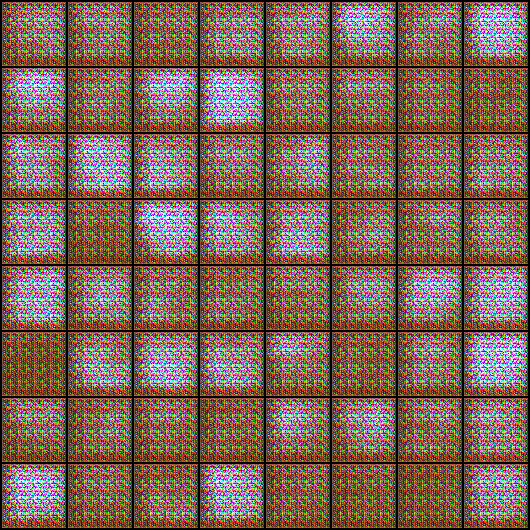

In [ ]:
Image('./generated/generated=images-0001.png')


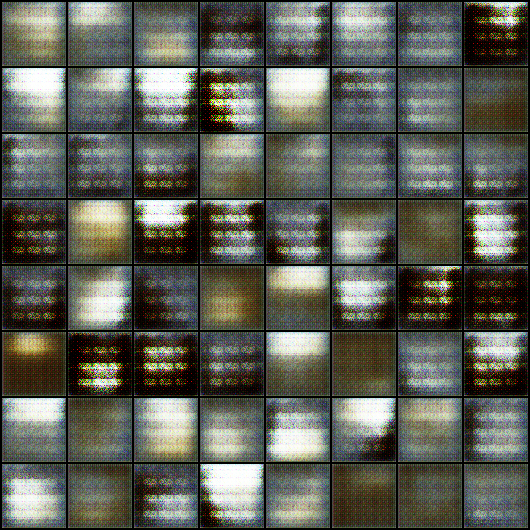

In [ ]:
Image('./generated/generated=images-0005.png')


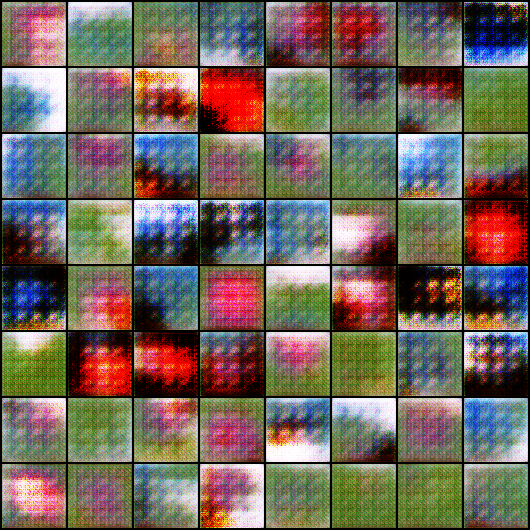

In [ ]:
Image('./generated/generated=images-0010.png')


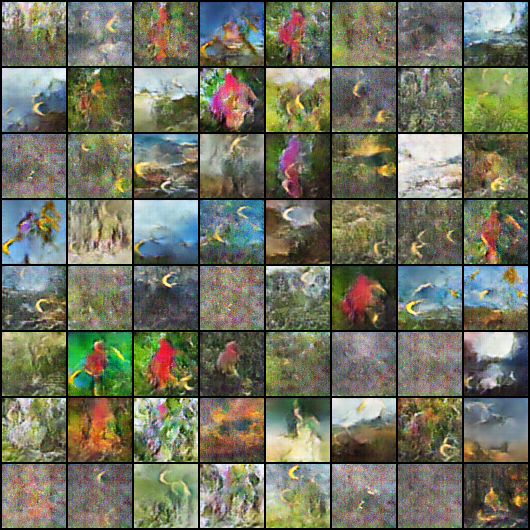

In [ ]:
Image('./generated/generated=images-0200.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.



In [ ]:
Simport cv2
import os

vid_fname = 'gans_training.avi'

print("Starting converting images to video.")
files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

print(files)

fourcc = cv2.VideoWriter_fourcc(*'MPEG')
out = cv2.VideoWriter(vid_fname,fourcc, 1.0, (640,480))
[out.write(cv2.imread(fname)) for fname in files]
out.release()
print("DONE!")

Here's what it looks like:



We can also visualize how the loss changes over time. Visualizing losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
from google.colab import drive
import shutil
import os

# This will prompt for authorization to access your drive.
drive.mount('/content/drive')

# Define the path to the folder and where you want to save it in your drive
local_folder = '/content/generated'  # The folder you want to save
drive_folder = '/content/drive/My Drive/generated'  # The destination folder in your drive

# Check if the local folder exists
if os.path.exists(local_folder):
    # Check if the destination folder already exists
    if not os.path.exists(drive_folder):
        # If it doesn't exist, create it
        os.makedirs(drive_folder)

    # Copy the folder to drive
    shutil.copytree(local_folder, drive_folder)
    print(f"'{local_folder}' has been copied to your Google Drive at '{drive_folder}'.")
else:
    print(f"The local directory '{local_folder}' does not exist.")
